# BNB: Distance to a Sketched Region and Gene Expression Gradient Along it
Data is obtained from 10X Genomics

In [10]:
%load_ext autoreload
%autoreload 2
%env ANYWIDGET_HMR=1

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
env: ANYWIDGET_HMR=1


In [11]:
import celldega as dega
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
from celldega.pre.boundary_tile import batch_transform_geometries
from celldega.pre import _to_geometry
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import geopandas as gpd
from shapely.geometry import Point


# Data initialization

In [12]:
dataset_name = 'Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_outs'
tech = 'Xenium'

DATA_DIR = f'../data'
data_dir = f'{DATA_DIR}/{dataset_name}'
path_landscape_files = f'{dataset_name}'

## Load region polygon (both in pixel and micron space)


In [13]:
# Load Geo parquet
gdf_pixel = gpd.read_parquet(f'{path_landscape_files}/sketched_regions_pixel.parquet')
gdf_micron = gpd.read_parquet(f'{path_landscape_files}/sketched_regions_micron.parquet')

## Transform points from pixel space to micron space

In [14]:
cell_meta = pd.read_parquet(f"{path_landscape_files}/cell_metadata.parquet")
cell_meta["geometry"] = cell_meta["geometry"].apply(lambda coords: Point(coords[0], coords[1]))
cell_meta_gdf = gpd.GeoDataFrame(cell_meta, geometry="geometry", crs="EPSG:4326")

gdf_join = gdf_pixel.sjoin(cell_meta_gdf, how='right', predicate='intersects').drop(columns=['index_left'], errors='ignore')
df_cluster = pd.read_parquet(f"{dataset_name}/cell_clusters/cluster.parquet")
gdf_join['cluster'] = df_cluster['cluster']

gene_list = ['TP53', 'MUC16','FOXL2']

for gene in gene_list:
    df_gene = pd.read_parquet(f"{dataset_name}/cbg/{gene}.parquet")
    df_gene['cell_id'] = df_gene.index
    gdf_join = pd.merge(gdf_join, df_gene, on='cell_id', how='left')
    
gdf_join.head()

/Users/whuan/opt/anaconda3/envs/celldega_env_2025/lib/python3.10/site-packages/geopandas/geodataframe.py:2195: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  return geopandas.sjoin(left_df=self, right_df=df, *args, **kwargs)  # noqa: B026


,cell_id,area,roi,color,name,geometry,cluster,TP53,MUC16,FOXL2
0,aaaaebmm-1,NaN,NaN,NaN,aaaaebmm-1,POINT (2545.24510 19907.04354),7,1.0,NaN,NaN
1,aaaafhpp-1,NaN,NaN,NaN,aaaafhpp-1,POINT (2507.57966 19966.68049),8,NaN,1.0,NaN
2,aaaahcem-1,NaN,NaN,NaN,aaaahcem-1,POINT (2483.01107 19955.99575),7,1.0,NaN,NaN
3,aaaakeoi-1,NaN,NaN,NaN,aaaakeoi-1,POINT (2514.67869 19925.56376),7,NaN,NaN,NaN
4,aaaalald-1,NaN,NaN,NaN,aaaalald-1,POINT (2482.79393 19919.32525),1,NaN,1.0,NaN


In [15]:
path_transformation_matrix = f'{path_landscape_files}/micron_to_image_transform.csv'

transformation_matrix = pd.read_csv(
    path_transformation_matrix, header=None, sep=" "
).values

# From pixel to micron space
inverse_matrix = np.linalg.inv(transformation_matrix)
gdf_join_micron = gdf_join.copy()
gdf_join_micron["geometry"] = batch_transform_geometries(gdf_join_micron["geometry"], inverse_matrix, 1)
gdf_join_micron['geometry'] = gdf_join_micron['geometry'].apply(_to_geometry)
gdf_join_micron.head()

,cell_id,area,roi,color,name,geometry,cluster,TP53,MUC16,FOXL2
0,aaaaebmm-1,NaN,NaN,NaN,aaaaebmm-1,POINT (540.86462 4230.24707),7,1.0,NaN,NaN
1,aaaafhpp-1,NaN,NaN,NaN,aaaafhpp-1,POINT (532.86072 4242.91992),8,NaN,1.0,NaN
2,aaaahcem-1,NaN,NaN,NaN,aaaahcem-1,POINT (527.63989 4240.64941),7,1.0,NaN,NaN
3,aaaakeoi-1,NaN,NaN,NaN,aaaakeoi-1,POINT (534.36926 4234.18262),7,NaN,NaN,NaN
4,aaaalald-1,NaN,NaN,NaN,aaaalald-1,POINT (527.59375 4232.85693),1,NaN,1.0,NaN


# Select a polygon for further analysis

In [16]:
roi = 'ROI 1'

gdf_selected = gdf_micron.loc[gdf_pixel['roi']==roi]
gdf_join_micron['distance_to_polygon'] = gdf_join_micron['geometry'].apply(lambda point: gdf_selected.geometry.iloc[0].distance(point))

## Distance to polygon (multi-color)

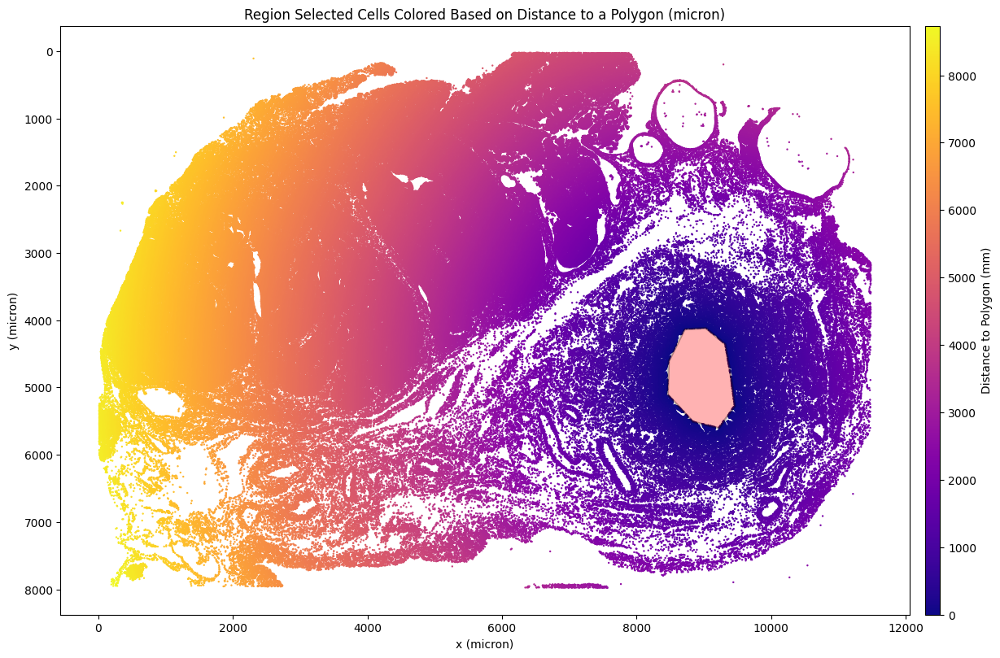

In [17]:
# Normalize distances to use for color mapping
norm = mcolors.Normalize(vmin=gdf_join_micron['distance_to_polygon'].min(), vmax=gdf_join_micron['distance_to_polygon'].max())

# Use a colormap with faster color transitions (e.g., 'plasma' or 'cubehelix')
cmap = cm.plasma

# Map distances to colors
gdf_join_micron['color'] = gdf_join_micron['distance_to_polygon'].apply(lambda x: cmap(norm(x)))

# Identify points inside the polygon
polygon = gdf_selected.geometry.iloc[0]  # Assuming one polygon
gdf_join_micron['inside_polygon'] = gdf_join_micron['geometry'].apply(lambda x: polygon.contains(x))

# Create the plot
fig, ax = plt.subplots(figsize=(20,8))

# Plot the points outside the polygon with a gradient color
gdf_join_micron[~gdf_join_micron['inside_polygon']].plot(
    ax=ax,
    color=gdf_join_micron[~gdf_join_micron['inside_polygon']]['color'],
    aspect=1,
    legend=True,
    markersize=0.5,  # Adjust point size as needed
    label='Points Outside Polygon'
)

# # Optionally, plot points inside the polygon with a different color or skip this step
# gdf_join_micron[gdf_join_micron['inside_polygon']].plot(
#     ax=ax,
#     color='blue',  # Different color for points inside
#     markersize=0.5,
#     label='Points Inside Polygon'
# )

# Plot the polygon as a filled area
gdf_selected.plot(ax=ax, color='red', aspect=1, alpha=0.3, edgecolor='black', linewidth=2, label='Polygon')

# Add colorbar for the gradient
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, orientation='vertical', pad=0.01, aspect=40)
cbar.set_label("Distance to Polygon (mm)")

# Adjust the plot
ax.invert_yaxis()
plt.title("Region Selected Cells Colored Based on Distance to a Polygon (micron)")
plt.tight_layout()
plt.xlabel('x (micron)')
plt.ylabel('y (micron)')
plt.show()


# Plot gene expression gradient along the distance to selected polygon

/Users/whuan/opt/anaconda3/envs/celldega_env_2025/lib/python3.10/site-packages/geopandas/geodataframe.py:2195: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4326
Right CRS: None

  return geopandas.sjoin(left_df=self, right_df=df, *args, **kwargs)  # noqa: B026


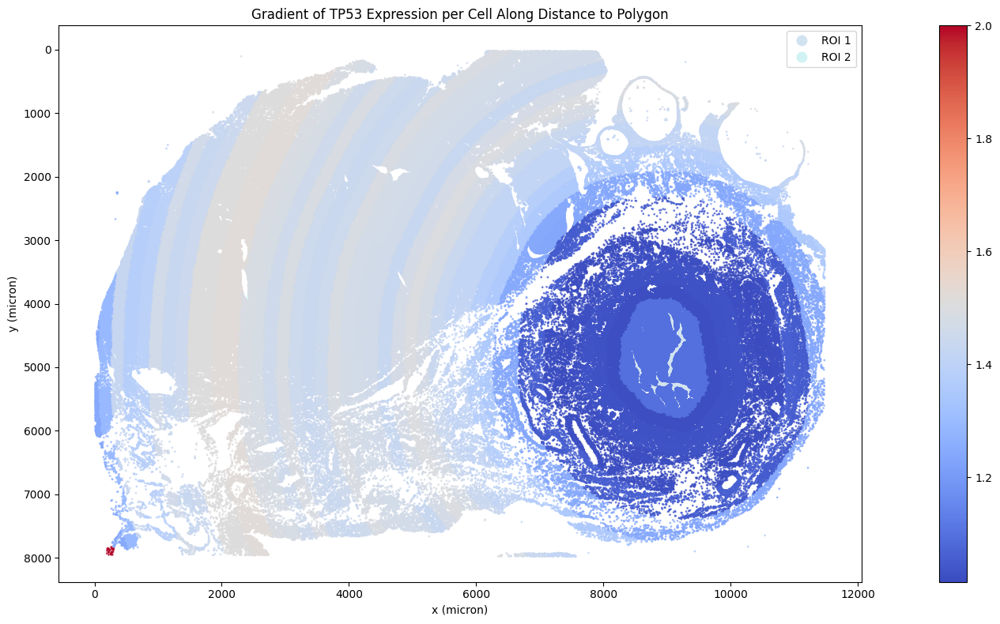

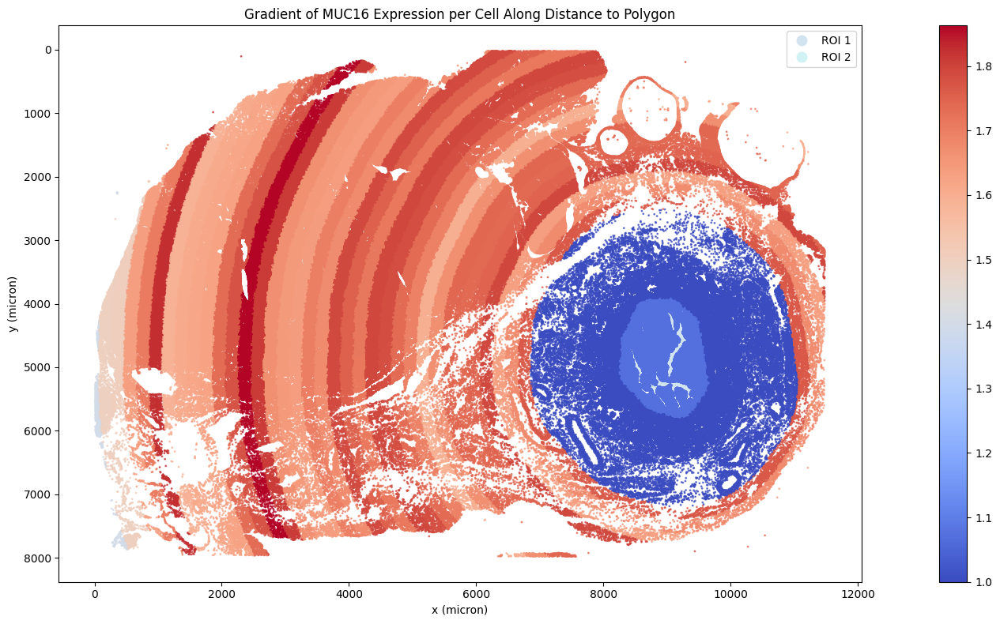

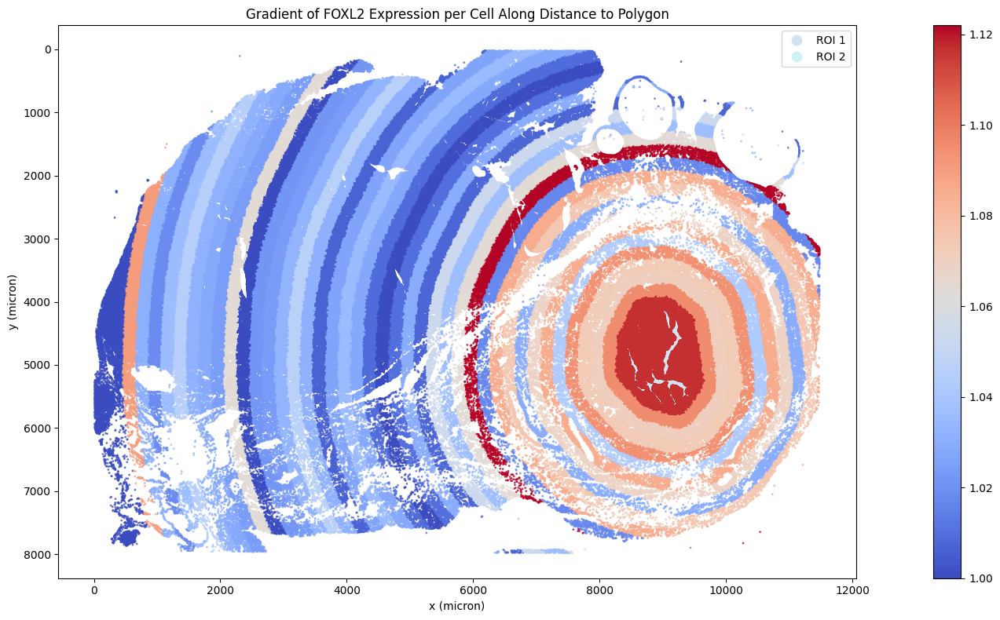

In [18]:
# Define band width in microns
band_width = 200  

# Create buffers at multiple distances using the `buffer` function
band_list = []
for i in range(1, 6):  # Creates 5 bands (adjust as needed)
    band = gdf_micron.copy()
    band['geometry'] = band['geometry'].buffer(i * band_width)  # Expand buffer
    band['band'] = i  # Assign band number
    band_list.append(band)

# Merge all bands into a single GeoDataFrame
gdf_bands = gpd.GeoDataFrame(pd.concat(band_list, ignore_index=True), crs=gdf_micron.crs)

# **Save as GeoParquet file**
gdf_bands.to_parquet(f"{path_landscape_files}/gdf_{band_width}_um_bands_from_{roi.lower().replace(' ','_')}.parquet", engine="pyarrow")  # Saves as GeoParquet

# Spatial join: Assign each cell in gdf_join_micron to the closest buffer
gdf_join_all = gdf_join_micron.sjoin(gdf_bands, how="left", predicate="within")

# Compute mean expression per band
gdf_join_all['band'] = (gdf_join_all['distance_to_polygon'] // band_width).astype(int)

# for gene in ['EPCAM']:
for gene in gene_list:
    gdf_plot = gdf_join_all.copy()
    
    # Compute mean expression for each band
    band_avg_expression = gdf_plot.groupby('band')[gene].mean().reset_index()
    band_avg_expression.columns = ['band', f'{gene}_mean']
    
    # Merge mean expression back
    gdf_plot = gdf_plot.merge(band_avg_expression, on='band')

    # Plot results
    fig, ax = plt.subplots(figsize=(20, 8))
    gdf_micron.plot(ax=ax, column='roi', aspect=1, legend=True, cmap='tab10', alpha=0.2)

    gdf_plot.plot(
        ax=ax,
        column=f'{gene}_mean',
        aspect=1,
        cmap='coolwarm',
        legend=True,
        alpha=0.7,
        markersize=1
    )

    ax.invert_yaxis()
    plt.title(f"Gradient of {gene} Expression per Cell Along Distance to Polygon")
    plt.xlabel("x (micron)")
    plt.ylabel("y (micron)")
    plt.tight_layout()
    plt.show()
